<p style="align: center;"><img align=center src="https://drive.google.com/uc?export=view&id=1I8kDikouqpH4hf7JBiSYAeNT2IO52T-T" width=600 height=480/></p>
<h3 style="text-align: center;"><b>Школа глубокого обучения ФПМИ МФТИ</b></h3>

<h3 style="text-align: center;"><b>Домашнее задание. Весна 2021</b></h3>

# Generative adversarial networks


В этом домашнем задании вы обучите GAN генерировать лица людей и посмотрите на то, как можно оценивать качество генерации

In [ ]:
import os
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
import torchvision.transforms as tt
import torch
import torch.nn as nn
import cv2
from tqdm.notebook import tqdm
from torchvision.utils import save_image
from torchvision.utils import make_grid
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
%matplotlib inline

sns.set(style='darkgrid', font_scale=1.2)

In [ ]:
!nvidia-smi

Wed Jun  9 08:11:00 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 465.27       Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla K80           Off  | 00000000:00:04.0 Off |                    0 |
| N/A   35C    P8    28W / 149W |      0MiB / 11441MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

## Часть 1. Подготовка данных (1 балл)

В качестве обучающей выборки возьмем часть датасета [Flickr Faces](https://github.com/NVlabs/ffhq-dataset), который содержит изображения лиц людей в высоком разрешении (1024х1024). Оригинальный датасет очень большой, поэтому мы возьмем его часть. Скачать датасет можно [здесь](https://drive.google.com/file/d/1KWPc4Pa7u2TWekUvNu9rTSO0U2eOlZA9/view?usp=sharing)

In [ ]:
!gdown --id 1Lxogo228UVwXMSemxOdwuYZRUDHRDaCQ -O faces_dataset_small.zip

Downloading...
From: https://drive.google.com/uc?id=1Lxogo228UVwXMSemxOdwuYZRUDHRDaCQ
To: /content/faces_dataset_small.zip
22.8MB [00:00, 107MB/s] 


In [ ]:
!unzip -n /content/faces_dataset_small.zip
!rm -r /content/__MACOSX
# !rm -r /content/generated

Archive:  /content/faces_dataset_small.zip
   creating: faces64c/
   creating: faces64c/faces/
  inflating: faces64c/faces/01799.jpg  
  inflating: faces64c/faces/02795.jpg  
  inflating: faces64c/faces/02869.jpg  
  inflating: faces64c/faces/01960.jpg  
  inflating: faces64c/faces/02978.jpg  
  inflating: faces64c/faces/02848.jpg  
  inflating: faces64c/faces/02994.jpg  
  inflating: faces64c/faces/01241.jpg  
  inflating: faces64c/faces/02897.jpg  
  inflating: faces64c/faces/03558.jpg  
  inflating: faces64c/faces/04495.jpg  
  inflating: faces64c/faces/01688.jpg  
  inflating: faces64c/faces/01564.jpg  
  inflating: faces64c/faces/01834.jpg  
  inflating: faces64c/faces/04537.jpg  
  inflating: faces64c/faces/03935.jpg  
  inflating: faces64c/faces/00273.jpg  
  inflating: faces64c/faces/01371.jpg  
  inflating: faces64c/faces/02619.jpg  
  inflating: faces64c/faces/04698.jpg  
  inflating: faces64c/faces/02757.jpg  
  inflating: faces64c/faces/01312.jpg  
  inflating: faces64c/fac

Давайте загрузим наши изображения. Напишите функцию, которая строит DataLoader для изображений, при этом меняя их размер до нужного значения

In [ ]:
DATA_DIR = '/content/faces64c'
image_size = 64
batch_size = 128
latent_size = 1024
stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)

#TODO: build dataloader and transfer it to device
def get_dataloader(image_size=image_size, batch_size=batch_size):
    """
    Builds dataloader for training data.
    Use tt.Compose and tt.Resize for transformations
    :param image_size: height and wdith of the image
    :param batch_size: batch_size of the dataloader
    :returns: DataLoader object 
    """
    # TODO: resize images, convert them to tensors and build dataloader
    train_ds = ImageFolder(DATA_DIR,
                           transform=tt.Compose([
                                                #  tt.Resize(image_size),
                                                #  tt.CenterCrop(image_size),
                                                 tt.ToTensor(),
                                                 tt.Normalize(*stats)]))
    train_dl = DataLoader(train_ds, batch_size, shuffle=True, num_workers=2, pin_memory=True)
    return train_dl

In [ ]:
def denorm(img_tensors):
    return img_tensors * stats[1][0] + stats[0][0]

def show_images(images, nmax=64):
    fig, ax = plt.subplots(figsize=(12, 12))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(denorm(images.detach()[:nmax]), nrow=8).permute(1, 2, 0))

def show_batch(dl, nmax=64):
    for images, _ in dl:
        show_images(images, nmax)
        break

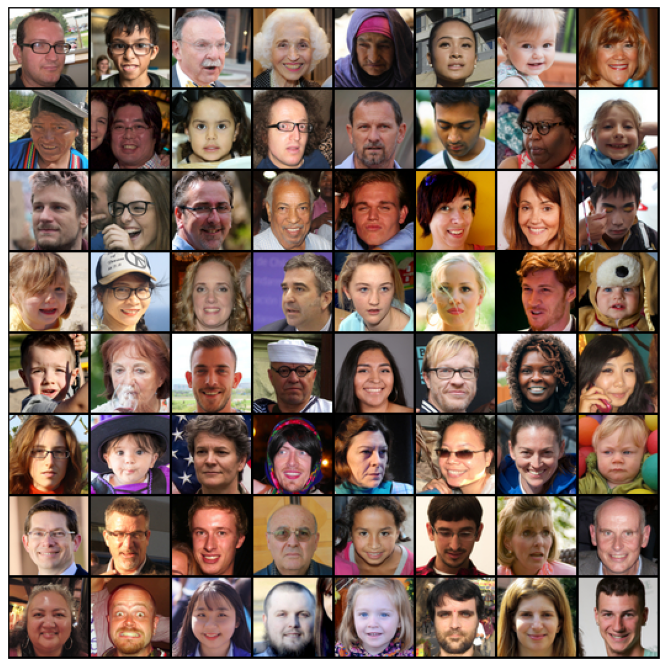

In [ ]:
train_dl = get_dataloader()
show_batch(train_dl)

## Часть 2. Построение и обучение модели (2 балла)

Сконструируйте генератор и дискриминатор. Помните, что:
* дискриминатор принимает на вход изображение (тензор размера `3 x image_size x image_size`) и выдает вероятность того, что изображение настоящее (тензор размера 1)

* генератор принимает на вход тензор шумов размера `latent_size x 1 x 1` и генерирует изображение размера `3 x image_size x image_size`

In [ ]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
print(device)

def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device
        
    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dl: 
            yield to_device(b, self.device)

    def __len__(self):
        """Number of batches"""
        return len(self.dl)

cuda


In [ ]:
train_dl = DeviceDataLoader(train_dl, device)

In [ ]:
discriminator = nn.Sequential(
    # in: 3 x 64 x 64

    nn.Conv2d(3, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 128 x 32 x 32

    nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 256 x 16 x 16

    nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(512),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 512 x 8 x 8

    nn.Conv2d(512, 1024, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(1024),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 1024 x 4 x 4

    nn.Conv2d(1024, 1, kernel_size=4, stride=1, padding=0, bias=False),
    # out: 1 x 1 x 1

    nn.Flatten(),
    nn.Sigmoid())

In [ ]:
# discriminator = nn.Sequential(
#     # in: 3 x 64 x 64

#     nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
#     nn.BatchNorm2d(64),
#     nn.LeakyReLU(0.2, inplace=True),
#     # out: 64 x 32 x 32

#     nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
#     nn.BatchNorm2d(128),
#     nn.LeakyReLU(0.2, inplace=True),
#     # out: 128 x 16 x 16

#     nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
#     nn.BatchNorm2d(256),
#     nn.LeakyReLU(0.2, inplace=True),
#     # out: 256 x 8 x 8

#     nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
#     nn.BatchNorm2d(512),
#     nn.LeakyReLU(0.2, inplace=True),
#     # out: 512 x 4 x 4

#     nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False),
#     # out: 1 x 1 x 1

#     nn.Flatten(),
#     nn.Sigmoid())

In [ ]:
discriminator = to_device(discriminator, device)

In [ ]:
from torchsummary import summary

summary(discriminator, (3, image_size, image_size))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1          [-1, 128, 32, 32]           6,144
       BatchNorm2d-2          [-1, 128, 32, 32]             256
         LeakyReLU-3          [-1, 128, 32, 32]               0
            Conv2d-4          [-1, 256, 16, 16]         524,288
       BatchNorm2d-5          [-1, 256, 16, 16]             512
         LeakyReLU-6          [-1, 256, 16, 16]               0
            Conv2d-7            [-1, 512, 8, 8]       2,097,152
       BatchNorm2d-8            [-1, 512, 8, 8]           1,024
         LeakyReLU-9            [-1, 512, 8, 8]               0
           Conv2d-10           [-1, 1024, 4, 4]       8,388,608
      BatchNorm2d-11           [-1, 1024, 4, 4]           2,048
        LeakyReLU-12           [-1, 1024, 4, 4]               0
           Conv2d-13              [-1, 1, 1, 1]          16,384
          Flatten-14                   

In [ ]:
generator = nn.Sequential(
    # in: latent_size x 1 x 1

    nn.ConvTranspose2d(latent_size, 512, kernel_size=4, stride=1, padding=0, bias=False),
    nn.BatchNorm2d(512),
    nn.ReLU(True),
    # out: 512 x 4 x 4

    nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.ReLU(True),
    # out: 256 x 8 x 8

    nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.ReLU(True),
    # out: 128 x 16 x 16

    nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.ReLU(True),
    # out: 64 x 32 x 32

    nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
    nn.Tanh()
    # out: 3 x 64 x 64
)

In [ ]:
generator = to_device(generator, device)

In [ ]:
summary(generator, (latent_size, 1, 1))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
   ConvTranspose2d-1            [-1, 512, 4, 4]       8,388,608
       BatchNorm2d-2            [-1, 512, 4, 4]           1,024
              ReLU-3            [-1, 512, 4, 4]               0
   ConvTranspose2d-4            [-1, 256, 8, 8]       2,097,152
       BatchNorm2d-5            [-1, 256, 8, 8]             512
              ReLU-6            [-1, 256, 8, 8]               0
   ConvTranspose2d-7          [-1, 128, 16, 16]         524,288
       BatchNorm2d-8          [-1, 128, 16, 16]             256
              ReLU-9          [-1, 128, 16, 16]               0
  ConvTranspose2d-10           [-1, 64, 32, 32]         131,072
      BatchNorm2d-11           [-1, 64, 32, 32]             128
             ReLU-12           [-1, 64, 32, 32]               0
  ConvTranspose2d-13            [-1, 3, 64, 64]           3,072
             Tanh-14            [-1, 3,

In [ ]:
sample_dir = 'generated'
os.makedirs(sample_dir, exist_ok=True)

# функция сохранения изображений
def save_samples(index, latent_tensors, show=True):
    fake_images = generator(latent_tensors)
    fake_fname = 'generated-images-{0:0=4d}.png'.format(index)
    save_image(denorm(fake_images), os.path.join(sample_dir, fake_fname), nrow=8)
    # save_image(fake_images, os.path.join(sample_dir, fake_fname), nrow=8)
    print('Saving', fake_fname)
    if show:
        fig, ax = plt.subplots(figsize=(8, 8))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(fake_images.cpu().detach(), nrow=8).permute(1, 2, 0))

In [ ]:
fixed_latent = torch.randn(4, latent_size, 1, 1, device=device)

Перейдем теперь к обучению нашего GANа. Алгоритм обучения следующий:
1. Учим дискриминатор:
  * берем реальные изображения и присваиваем им метку 1
  * генерируем изображения генератором и присваиваем им метку 0
  * обучаем классификатор на два класса

2. Учим генератор:
  * генерируем изображения генератором и присваиваем им метку 0
  * предсказываем дискриминаторором, реальное это изображение или нет


В качестве функции потерь берем бинарную кросс-энтропию

In [ ]:
def fit(model, criterion, epochs, lr, start_idx=1, save_interval=5):
    model["discriminator"].train()
    model["generator"].train()
    torch.cuda.empty_cache()
    
    # Losses & scores
    losses_g = []
    losses_d = []
    real_scores = []
    fake_scores = []
    
    # Create optimizers
    optimizer = {
        # !!! разный LR
        "discriminator": torch.optim.Adam(model["discriminator"].parameters(), 
                                          lr=lr, betas=(0.5, 0.999)),
        "generator": torch.optim.Adam(model["generator"].parameters(),
                                      lr=lr*5, betas=(0.5, 0.999))
    }
    
    for epoch in range(epochs):
        loss_d_per_epoch = []
        loss_g_per_epoch = []
        real_score_per_epoch = []
        fake_score_per_epoch = []
        for real_images, _ in tqdm(train_dl):
            # Train discriminator
            # Clear discriminator gradients
            optimizer["discriminator"].zero_grad()

            # Pass real images through discriminator
            real_preds = model["discriminator"](real_images)
            # добавил шум
            real_targets = torch.ones(real_images.size(0), 1, device=device) - torch.rand(real_images.size(0), 1, device=device) * 0.05
            real_loss = criterion["discriminator"](real_preds, real_targets)
            cur_real_score = torch.mean(real_preds).item()
            
            # Generate fake images
            latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
            fake_images = model["generator"](latent)

            # Pass fake images through discriminator
            # добавил шум
            fake_targets = torch.zeros(fake_images.size(0), 1, device=device) + torch.rand(fake_images.size(0), 1, device=device) * 0.05
            fake_preds = model["discriminator"](fake_images)
            fake_loss = criterion["discriminator"](fake_preds, fake_targets)
            cur_fake_score = torch.mean(fake_preds).item()

            real_score_per_epoch.append(cur_real_score)
            fake_score_per_epoch.append(cur_fake_score)

            # Update discriminator weights
            loss_d = real_loss + fake_loss
            loss_d.backward()
            optimizer["discriminator"].step()
            loss_d_per_epoch.append(loss_d.item())


            # Train generator
            # Clear generator gradients
            optimizer["generator"].zero_grad()
            
            # Generate fake images
            latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
            fake_images = model["generator"](latent)
            
            # Try to fool the discriminator
            preds = model["discriminator"](fake_images)
            targets = torch.ones(batch_size, 1, device=device)
            loss_g = criterion["generator"](preds, targets)
            
            # Update generator weights
            loss_g.backward()
            optimizer["generator"].step()
            loss_g_per_epoch.append(loss_g.item())

        # show_real_images
        # show_images(denorm(real_images[:4].cpu().detach()))

        # show_fake_images
        # show_images(denorm(fake_images[:4].cpu().detach()))

        # Record losses & scores
        losses_g.append(np.mean(loss_g_per_epoch))
        losses_d.append(np.mean(loss_d_per_epoch))
        real_scores.append(np.mean(real_score_per_epoch))
        fake_scores.append(np.mean(fake_score_per_epoch))
        
        # Log losses & scores (last batch)
        print("Epoch [{}/{}], loss_g: {:.4f}, loss_d: {:.4f}, real_score: {:.4f}, fake_score: {:.4f}".format(
            epoch+1, epochs, 
            losses_g[-1], losses_d[-1], real_scores[-1], fake_scores[-1]))
    
        # Save/show generated images
        if (epoch == epochs - 1) or (epoch % save_interval == 0):
            save_samples(epoch+start_idx, fixed_latent, show=False)
            show_images(denorm(model['generator'](fixed_latent).cpu().detach()))
        plt.show()
    # model["discriminator"].eval()
    # model["generator"].eval()
    return losses_g, losses_d, real_scores, fake_scores

In [ ]:
lr = 0.0003
epochs = 100

model = {
    "discriminator": discriminator,
    "generator": generator
}

criterion = {
    "discriminator": nn.BCELoss(),
    "generator": nn.BCELoss()
}


Epoch [1/100], loss_g: 12.3557, loss_d: 1.7012, real_score: 0.8925, fake_score: 0.2013
Saving generated-images-0001.png


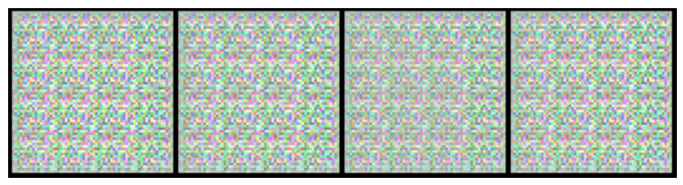


Epoch [2/100], loss_g: 5.7880, loss_d: 0.7321, real_score: 0.8857, fake_score: 0.1640
Saving generated-images-0002.png


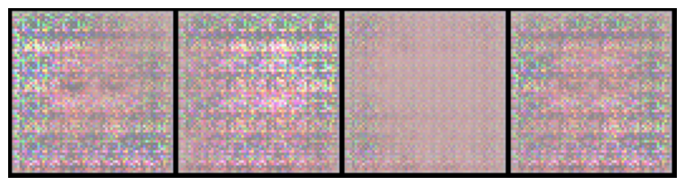


Epoch [3/100], loss_g: 4.3469, loss_d: 0.9331, real_score: 0.7925, fake_score: 0.2270
Saving generated-images-0003.png


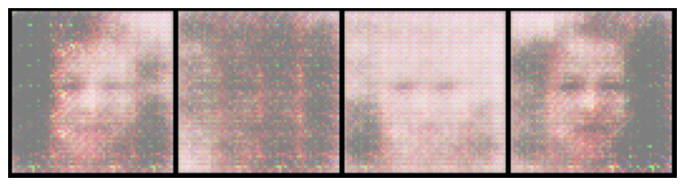


Epoch [4/100], loss_g: 3.0533, loss_d: 1.1957, real_score: 0.6479, fake_score: 0.3460
Saving generated-images-0004.png


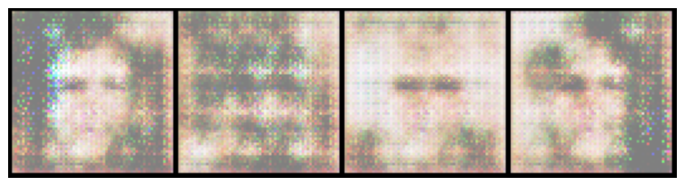


Epoch [5/100], loss_g: 2.6839, loss_d: 1.1411, real_score: 0.6375, fake_score: 0.3481
Saving generated-images-0005.png


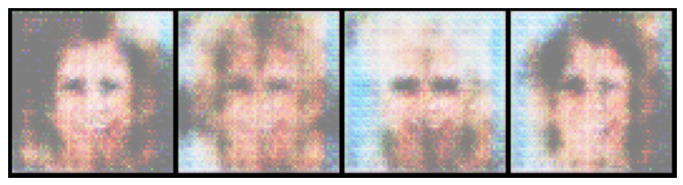


Epoch [6/100], loss_g: 3.0170, loss_d: 1.2477, real_score: 0.6382, fake_score: 0.3655
Saving generated-images-0006.png


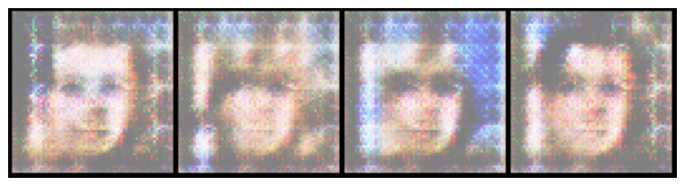


Epoch [7/100], loss_g: 3.2926, loss_d: 1.1143, real_score: 0.6576, fake_score: 0.3529
Saving generated-images-0007.png


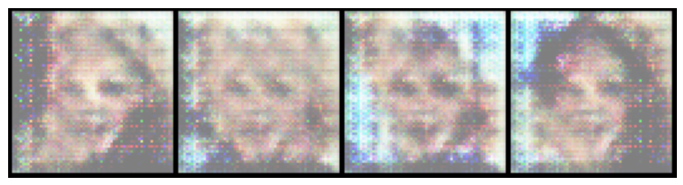


Epoch [8/100], loss_g: 3.8196, loss_d: 1.1399, real_score: 0.6694, fake_score: 0.3131
Saving generated-images-0008.png


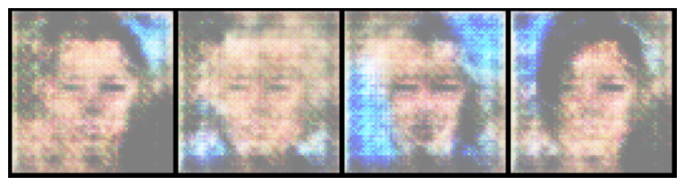


Epoch [9/100], loss_g: 2.9497, loss_d: 1.0428, real_score: 0.6672, fake_score: 0.3547
Saving generated-images-0009.png


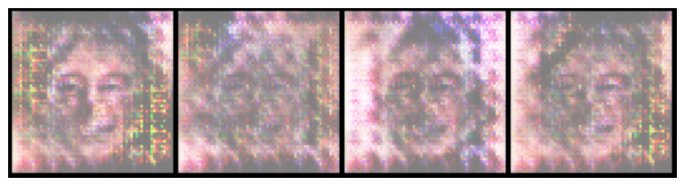


Epoch [10/100], loss_g: 3.9717, loss_d: 1.1726, real_score: 0.6643, fake_score: 0.3301
Saving generated-images-0010.png


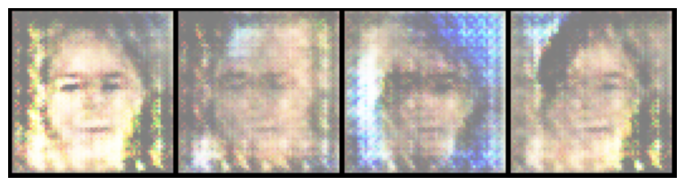


Epoch [11/100], loss_g: 2.5024, loss_d: 1.2188, real_score: 0.6028, fake_score: 0.3966
Saving generated-images-0011.png


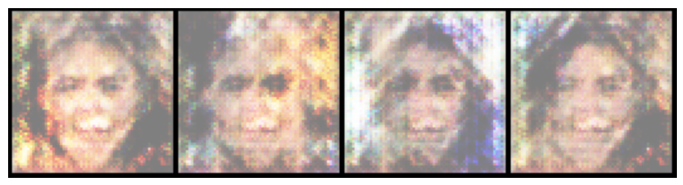


Epoch [12/100], loss_g: 2.7048, loss_d: 1.2137, real_score: 0.6090, fake_score: 0.3962
Saving generated-images-0012.png


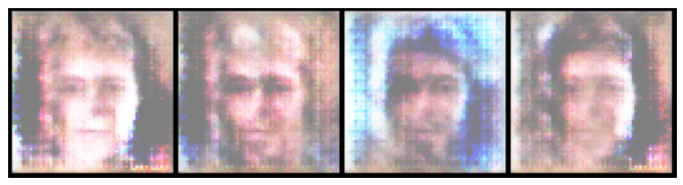


Epoch [13/100], loss_g: 2.9370, loss_d: 1.1897, real_score: 0.6252, fake_score: 0.3768
Saving generated-images-0013.png


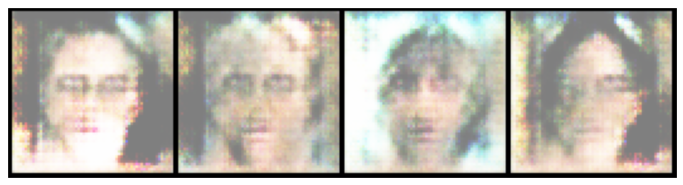


Epoch [14/100], loss_g: 2.7325, loss_d: 1.0860, real_score: 0.6513, fake_score: 0.3489
Saving generated-images-0014.png


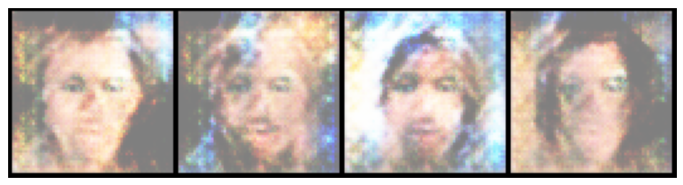


Epoch [15/100], loss_g: 2.9862, loss_d: 1.1908, real_score: 0.6229, fake_score: 0.3797
Saving generated-images-0015.png


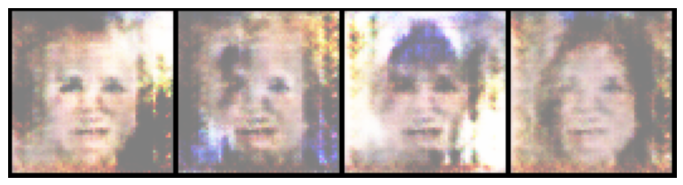


Epoch [16/100], loss_g: 2.9632, loss_d: 1.1458, real_score: 0.6339, fake_score: 0.3486
Saving generated-images-0016.png


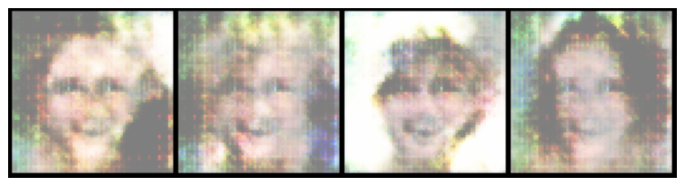


Epoch [17/100], loss_g: 2.9613, loss_d: 1.1286, real_score: 0.6478, fake_score: 0.3572
Saving generated-images-0017.png


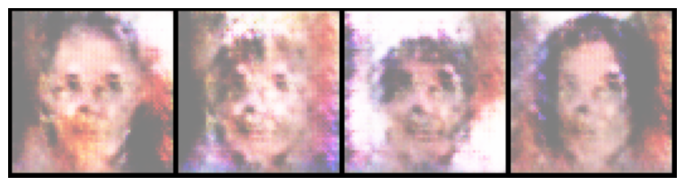


Epoch [18/100], loss_g: 3.0436, loss_d: 1.0876, real_score: 0.6440, fake_score: 0.3504
Saving generated-images-0018.png


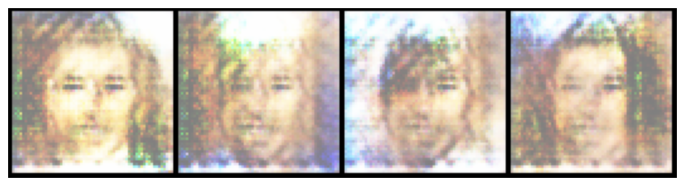


Epoch [19/100], loss_g: 2.9474, loss_d: 1.1163, real_score: 0.6481, fake_score: 0.3553
Saving generated-images-0019.png


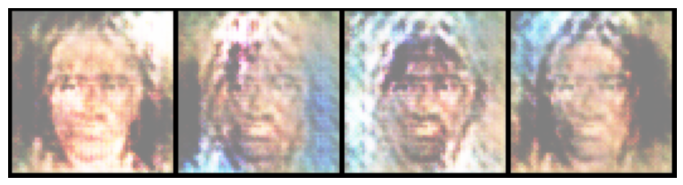


Epoch [20/100], loss_g: 2.6666, loss_d: 1.1429, real_score: 0.6333, fake_score: 0.3714
Saving generated-images-0020.png


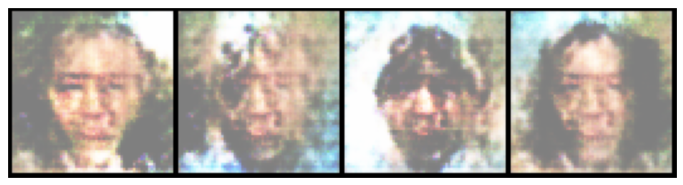


Epoch [21/100], loss_g: 2.9276, loss_d: 1.0719, real_score: 0.6391, fake_score: 0.3364
Saving generated-images-0021.png


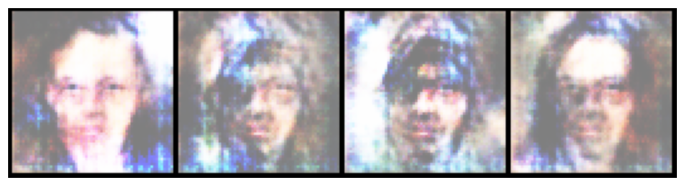


Epoch [22/100], loss_g: 3.2210, loss_d: 1.0475, real_score: 0.6710, fake_score: 0.3356
Saving generated-images-0022.png


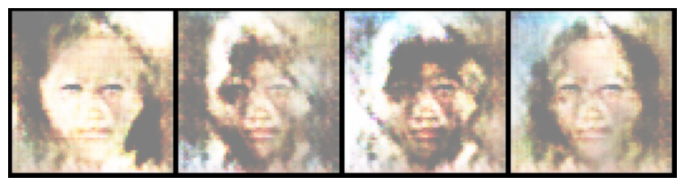


Epoch [23/100], loss_g: 3.0307, loss_d: 1.0396, real_score: 0.6640, fake_score: 0.3324
Saving generated-images-0023.png


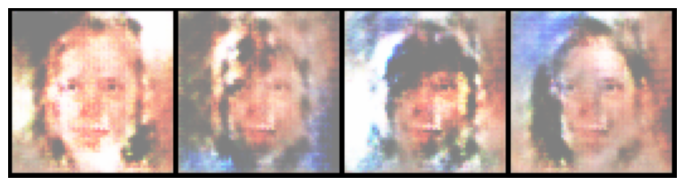


Epoch [24/100], loss_g: 3.2260, loss_d: 1.0632, real_score: 0.6819, fake_score: 0.3329
Saving generated-images-0024.png


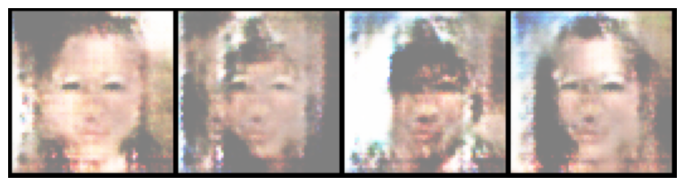


Epoch [25/100], loss_g: 3.1514, loss_d: 1.0569, real_score: 0.6737, fake_score: 0.3165
Saving generated-images-0025.png


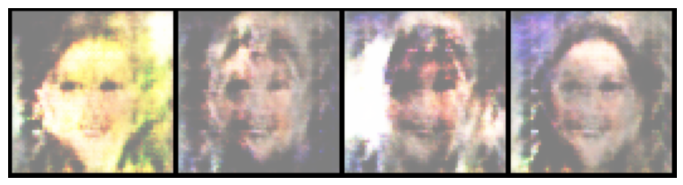


Epoch [26/100], loss_g: 3.1825, loss_d: 1.0431, real_score: 0.6651, fake_score: 0.3391
Saving generated-images-0026.png


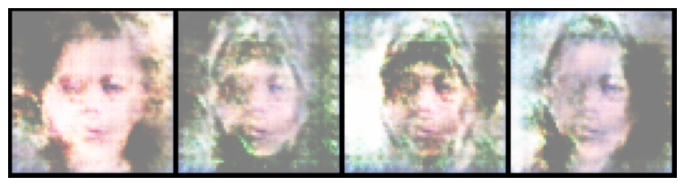


Epoch [27/100], loss_g: 3.1088, loss_d: 0.9110, real_score: 0.6900, fake_score: 0.2912
Saving generated-images-0027.png


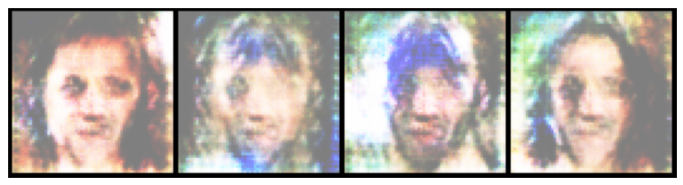


Epoch [28/100], loss_g: 2.7764, loss_d: 1.2048, real_score: 0.6451, fake_score: 0.3574
Saving generated-images-0028.png


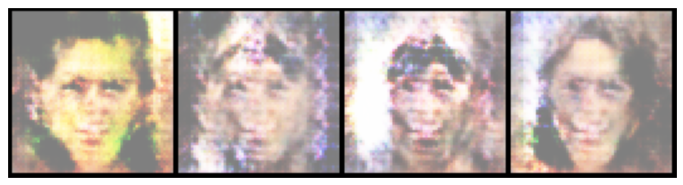


Epoch [29/100], loss_g: 3.0469, loss_d: 1.1178, real_score: 0.6526, fake_score: 0.3516
Saving generated-images-0029.png


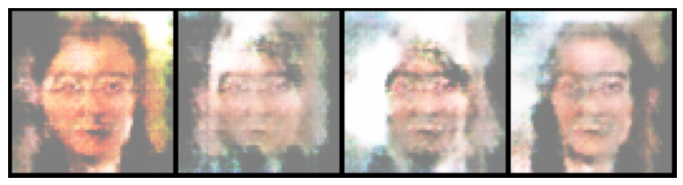


Epoch [30/100], loss_g: 3.1460, loss_d: 1.0009, real_score: 0.6730, fake_score: 0.3154
Saving generated-images-0030.png


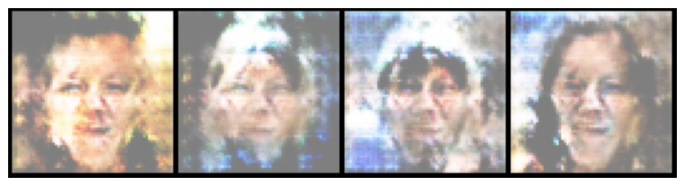


Epoch [31/100], loss_g: 3.3556, loss_d: 1.0700, real_score: 0.6653, fake_score: 0.3271
Saving generated-images-0031.png


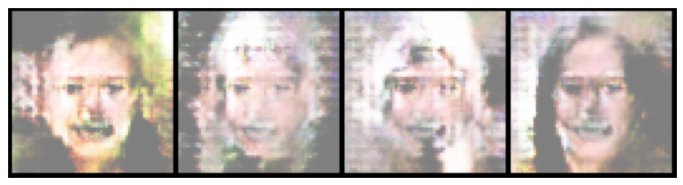


Epoch [32/100], loss_g: 3.0271, loss_d: 1.0987, real_score: 0.6519, fake_score: 0.3343
Saving generated-images-0032.png


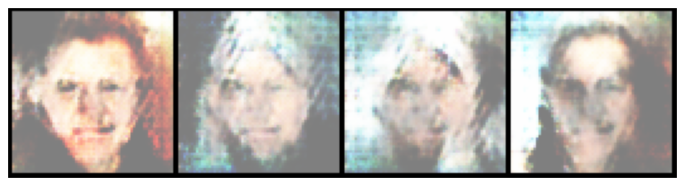


Epoch [33/100], loss_g: 2.9204, loss_d: 0.9495, real_score: 0.6964, fake_score: 0.3142
Saving generated-images-0033.png


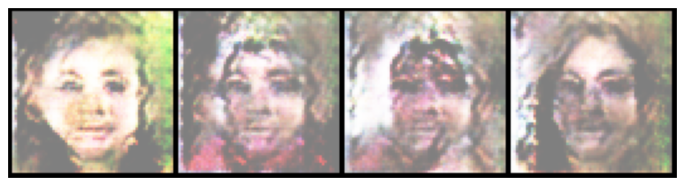


Epoch [34/100], loss_g: 3.7979, loss_d: 0.9890, real_score: 0.6905, fake_score: 0.3089
Saving generated-images-0034.png


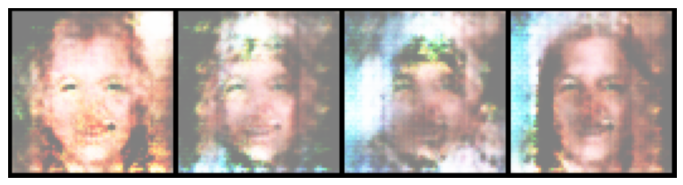


Epoch [35/100], loss_g: 3.2898, loss_d: 0.9668, real_score: 0.6866, fake_score: 0.2933
Saving generated-images-0035.png


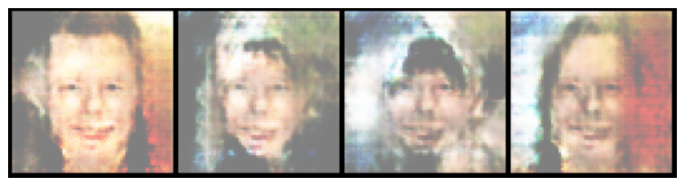


Epoch [36/100], loss_g: 3.1636, loss_d: 0.9180, real_score: 0.7088, fake_score: 0.2992
Saving generated-images-0036.png


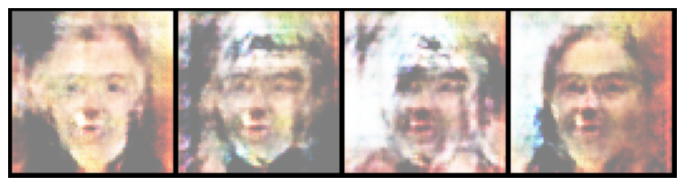


Epoch [37/100], loss_g: 3.1879, loss_d: 0.8964, real_score: 0.7070, fake_score: 0.2874
Saving generated-images-0037.png


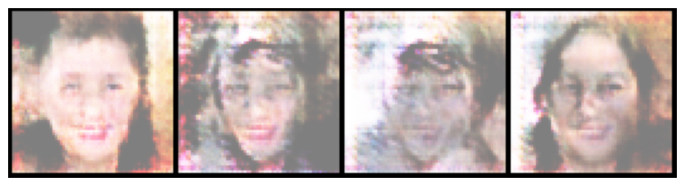


Epoch [38/100], loss_g: 3.4417, loss_d: 0.9121, real_score: 0.7036, fake_score: 0.2858
Saving generated-images-0038.png


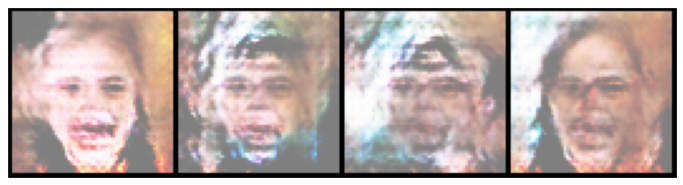


Epoch [39/100], loss_g: 3.6537, loss_d: 1.0454, real_score: 0.7008, fake_score: 0.3149
Saving generated-images-0039.png


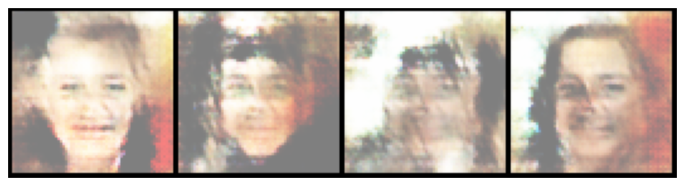


Epoch [40/100], loss_g: 3.3566, loss_d: 0.8262, real_score: 0.7199, fake_score: 0.2566
Saving generated-images-0040.png


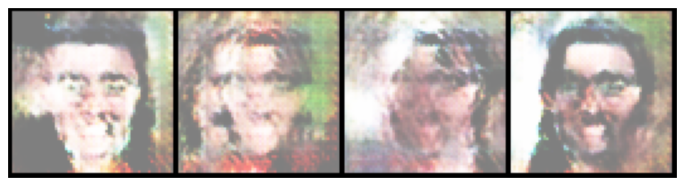


Epoch [41/100], loss_g: 3.7563, loss_d: 0.8297, real_score: 0.7392, fake_score: 0.2627
Saving generated-images-0041.png


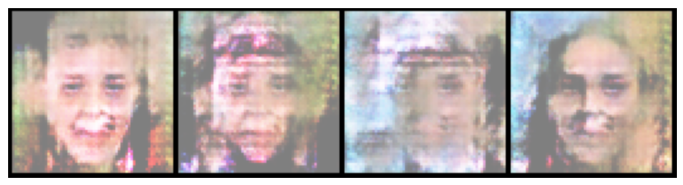


Epoch [42/100], loss_g: 3.5148, loss_d: 0.9735, real_score: 0.7112, fake_score: 0.2873
Saving generated-images-0042.png


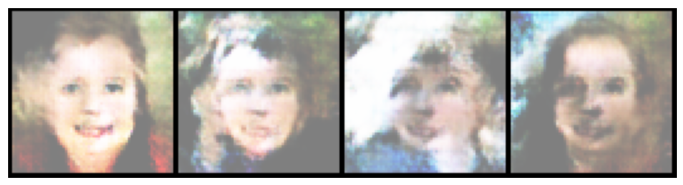


Epoch [43/100], loss_g: 3.1816, loss_d: 0.8735, real_score: 0.7188, fake_score: 0.2635
Saving generated-images-0043.png


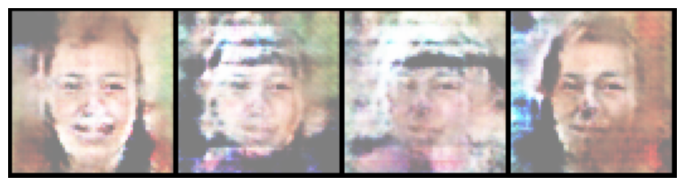


Epoch [44/100], loss_g: 3.5685, loss_d: 0.9598, real_score: 0.7192, fake_score: 0.3016
Saving generated-images-0044.png


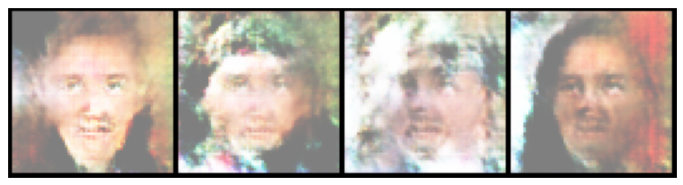


Epoch [45/100], loss_g: 3.7452, loss_d: 0.8935, real_score: 0.7214, fake_score: 0.2834
Saving generated-images-0045.png


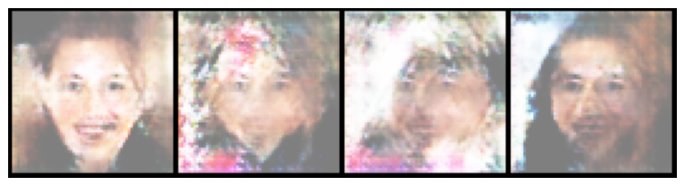


Epoch [46/100], loss_g: 3.5830, loss_d: 0.9205, real_score: 0.7153, fake_score: 0.2792
Saving generated-images-0046.png


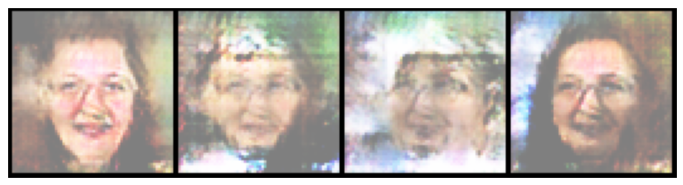


Epoch [47/100], loss_g: 3.6282, loss_d: 0.9180, real_score: 0.7133, fake_score: 0.2802
Saving generated-images-0047.png


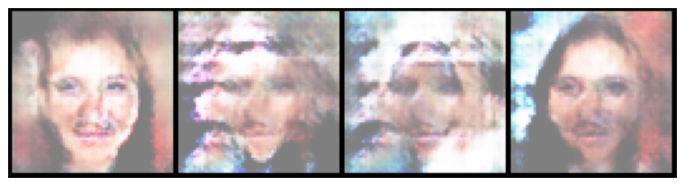


Epoch [48/100], loss_g: 3.5298, loss_d: 0.7743, real_score: 0.7432, fake_score: 0.2515
Saving generated-images-0048.png


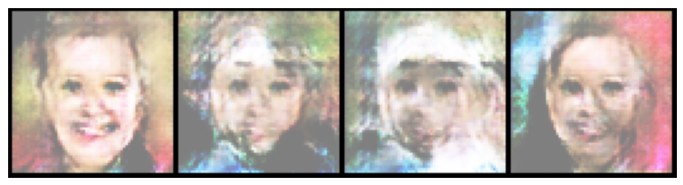


Epoch [49/100], loss_g: 3.7040, loss_d: 1.0116, real_score: 0.6900, fake_score: 0.2906
Saving generated-images-0049.png


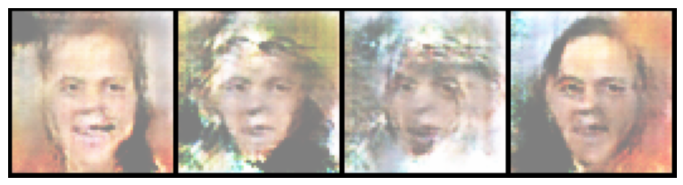


Epoch [50/100], loss_g: 3.3968, loss_d: 0.8100, real_score: 0.7269, fake_score: 0.2721
Saving generated-images-0050.png


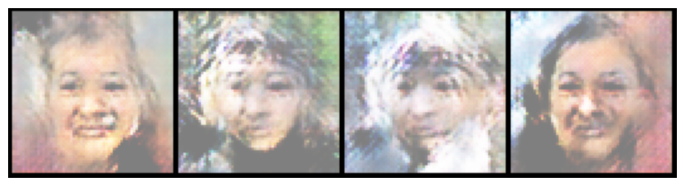


Epoch [51/100], loss_g: 3.5680, loss_d: 1.0366, real_score: 0.7029, fake_score: 0.3098
Saving generated-images-0051.png


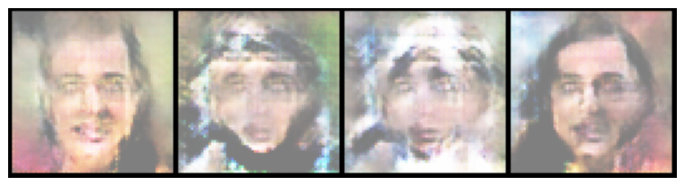


Epoch [52/100], loss_g: 3.6849, loss_d: 0.9185, real_score: 0.7218, fake_score: 0.2835
Saving generated-images-0052.png


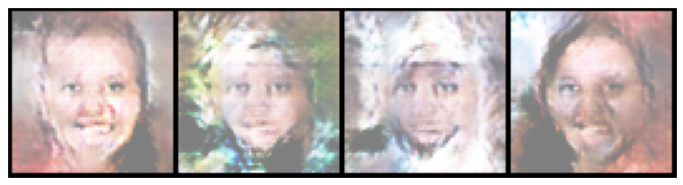


Epoch [53/100], loss_g: 3.5884, loss_d: 0.8445, real_score: 0.7199, fake_score: 0.2586
Saving generated-images-0053.png


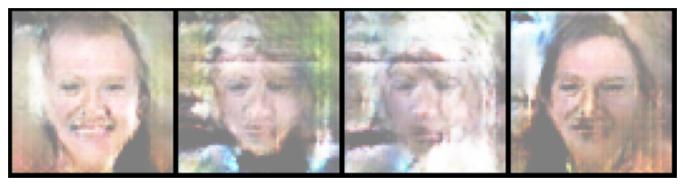

In [ ]:
history = fit(model, criterion, epochs, lr, save_interval=1)

Постройте графики лосса для генератора и дискриминатора. Что вы можете сказать про эти графики?

In [ ]:
losses_g, losses_d, real_scores, fake_scores = history

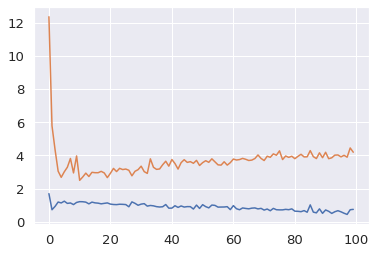

In [ ]:
plt.plot(pd.DataFrame({
    "discriminator": losses_d,
    "generator": losses_g
}));

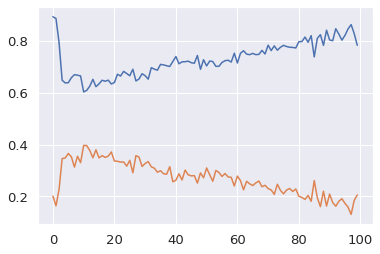

In [ ]:
plt.plot(pd.DataFrame({
    "real": real_scores,
    "fake": fake_scores
}));

Графики достаточно близки к ожидаемому результату, показанному на семинаре

## Часть 3. Генерация изображений (1 балл)

Теперь давайте оценим качество получившихся изображений. Напишите функцию, которая выводит изображения, сгенерированные нашим генератором

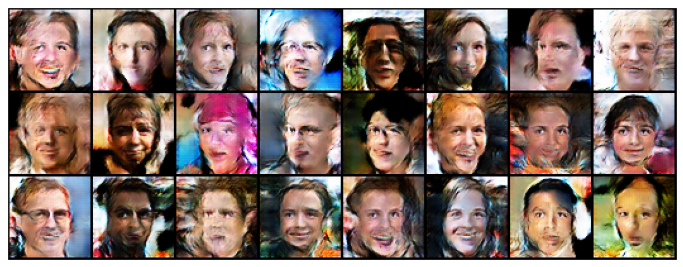

In [ ]:
n_images = 24

fixed_latent = torch.randn(n_images, latent_size, 1, 1, device=device)
fake_images = model["generator"](fixed_latent)
show_images(fake_images.detach().cpu())

Как вам качество получившихся изображений?

Так себе... хотелось бы лучше, но не получилось. Пробовал усложнять архитектуру, менять размер вектора и т.д. Не особо помогает.

Лучше качество получается при увеличении числа эпох, но это долго.

## Часть 4. Leave-one-out-1-NN classifier accuracy (6 баллов)

### 4.1. Подсчет accuracy (4 балла)

Не всегда бывает удобно оценивать качество сгенерированных картинок глазами. В качестве альтернативы вам предлагается реализовать следующий подход:
  * Сгенерировать столько же фейковых изображений, сколько есть настоящих в обучающей выборке. Присвоить фейковым метку класса 0, настоящим – 1.
  * Построить leave-one-out оценку: обучить 1NN Classifier (`sklearn.neighbors.KNeighborsClassifier(n_neighbors=1)`) предсказывать класс на всех объектах, кроме одного, проверить качество (accuracy) на оставшемся объекте. В этом вам поможет `sklearn.model_selection.LeaveOneOut`

Так как время и вычислительный ресурс ограничен, то буду брать меньше изображений размером 64*64. Иначе процесс будет очень долгий

In [ ]:
# генерируем фэйковые изображения
n_images = 200

fake_images = model["generator"](torch.randn(n_images, latent_size, 1, 1, device=device)).detach().cpu()
fake_target = torch.zeros(n_images)

In [ ]:
# реальные изображения
i = n_images // batch_size
real_images = torch.Tensor()
for batch_real_images, _ in train_dl:
    if i == 0:
        real_images = torch.cat((real_images, batch_real_images.detach().cpu()[:n_images % batch_size]))
        break
    real_images = torch.cat((real_images, batch_real_images.detach().cpu()))
    i -= 1

real_target = torch.ones(n_images)

In [ ]:
X = torch.cat((real_images, fake_images)).reshape(-1, 3*64*64)
y = torch.cat((real_target, fake_target))
print(X.shape)
print(y.shape)

torch.Size([400, 12288])
torch.Size([400])


In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import LeaveOneOut

loo = LeaveOneOut()
neigh = KNeighborsClassifier(n_neighbors=1, n_jobs=-1)

In [ ]:
prediction = []
for train_index, test_index in tqdm(loo.split(X, y)):
    neigh.fit(X[train_index], y[train_index])
    prediction.append(neigh.predict(X[test_index])[0])

In [ ]:
# подсчет Accuracy
(torch.Tensor(prediction) == y).sum()/(2*n_images)

tensor(0.7325)

Что вы можете сказать о получившемся результате? Какой accuracy мы хотели бы получить и почему?

Идеально было бы `Accuracy = 0.5`, это бы означало, что модель генерирует настолько реалистичные изображения, что классификатор каждый раз не может отличить фэйк от реального изображения. Очевидно, получившийся результат сложно назвать хорошим

### 4.2. Визуализация распределений (2 балла)

Давайте посмотрим на то, насколько похожи распределения настоящих и фейковых изображений. Для этого воспользуйтесь методом, снижающим размерность (к примеру, TSNE) и изобразите на графике разным цветом точки, соответствующие реальным и сгенерированным изображенияи

In [ ]:
from sklearn.manifold import TSNE

representation = TSNE().fit_transform(X)

In [ ]:
df_representation = pd.DataFrame({
    'x' : representation[:,0],
    'y' : representation[:,1],
    'label' : y})

df_representation = df_representation.sort_values(by='label')

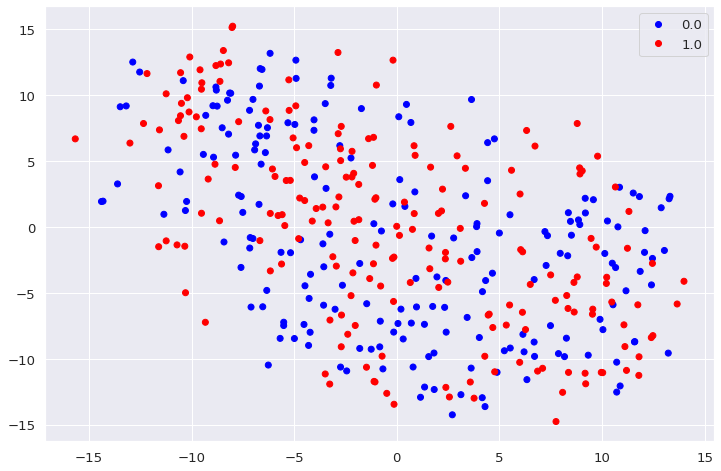

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(data=df_representation, x='x', y='y', c='label', cmap='bwr')
handles, _ = scatter.legend_elements(prop='colors')
plt.legend(handles, df_representation.label.unique())
plt.show()

Прокомментируйте получившийся результат:

Облака точек сильно перемешаны, это говорит о том, фэйковые и реальные изображения достаточно сложно отличить друг от друга. Хотя внутри каждого облака можно увидеть небольшие скопления точек того или иного класса.

В модели были добавлены случайные шумы к меткам классов, что привело к небольшому улучшению качества генерации на большом числе эпох.

Также "усилена" архитектура для дискриминатора и использованы разные LR для обучения.

Варианты улучшения результата:
- усложнение архитектуры моделей
- использование динамического LR
- увеличение числа эпох обучения (долго)
- изменение размера латентного вектора